In [1]:
# importing libraries

# libraries for file manipulation
import pandas as pd
import numpy as np

# libraries for easier visualisation
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns

# libraries for dimensionality reduction
import scipy.stats as stats
from sklearn import manifold
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans, DBSCAN, HDBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score

#from sklearn import metrics
from matplotlib import cm
# setting options
pd.set_option('display.max_columns', None)
pd.set_option('float_format', '{:f}'.format)

In [2]:
# importing dataset
df_orig = pd.read_csv("D:\Documents\Studijos\ML\star_classification.csv", delimiter=',')

<>:2: SyntaxWarning: invalid escape sequence '\D'
<>:2: SyntaxWarning: invalid escape sequence '\D'
C:\Users\edvar\AppData\Local\Temp\ipykernel_24956\2958153930.py:2: SyntaxWarning: invalid escape sequence '\D'
  df_orig = pd.read_csv("D:\Documents\Studijos\ML\star_classification.csv", delimiter=',')


## Preparing data

In [3]:
df_orig.drop(columns=['obj_ID', 'alpha', 'delta', 'spec_obj_ID', 'rerun_ID', 'MJD'], inplace=True)

# panaikinti ekstremalių atsiskyrėlių vieną eilutę, kurioje reikšmės yra -9999
df_orig = df_orig[(df_orig[['u', 'g', 'r', 'i', 'z']] != -9999).all(axis=1)]

# encoding labels
df_orig.replace(['GALAXY', 'QSO', 'STAR'], [0, 1, 2], inplace=True)

# Set a random seed for reproducibility
random_seed = 42
#random_seed = 2
# Sample 1,000 instances per class with a fixed seed
#df = df_orig.groupby('class', group_keys=False).apply(lambda x: x.sample(n=1000)).reset_index(drop=True)
df = df_orig.groupby('class', group_keys=False).apply(lambda x: x.sample(n=1000, random_state=random_seed)).reset_index(drop=True)

# kiti masyvai nebuvo normalizuot, nes jie buvo pavadinimai, kampo laipsniai, kategorijos ar ID
normalization_cols = ['redshift', 'u', 'g', 'r', 'i', 'z']

# normavimas
dfminmax = df.copy()
for col in normalization_cols:

    #min-max normalization
    dfminmax[col] = (dfminmax[col] - dfminmax[col].min()) / (dfminmax[col].max() - dfminmax[col].min())

C:\Users\edvar\AppData\Local\Temp\ipykernel_24956\2151516183.py:7: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_orig.replace(['GALAXY', 'QSO', 'STAR'], [0, 1, 2], inplace=True)
C:\Users\edvar\AppData\Local\Temp\ipykernel_24956\2151516183.py:14: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df_orig.groupby('class', group_keys=False).apply(lambda x: x.sample(n=1000, random_state=random_seed)).reset_index(drop=True)


In [4]:
dfminmax.columns

Index(['u', 'g', 'r', 'i', 'z', 'run_ID', 'cam_col', 'field_ID', 'class',
       'redshift', 'plate', 'fiber_ID'],
      dtype='object')

In [5]:
feature_cols = ['redshift', 'u', 'g', 'r', 'i', 'z']
no_class_col = ['u', 'g', 'r', 'i', 'z', 'run_ID', 'cam_col', 'field_ID', 'redshift', 'plate', 'fiber_ID']
data = dfminmax[feature_cols].values
data_full = dfminmax[no_class_col].values

## Dimensionallity reduction tSNE

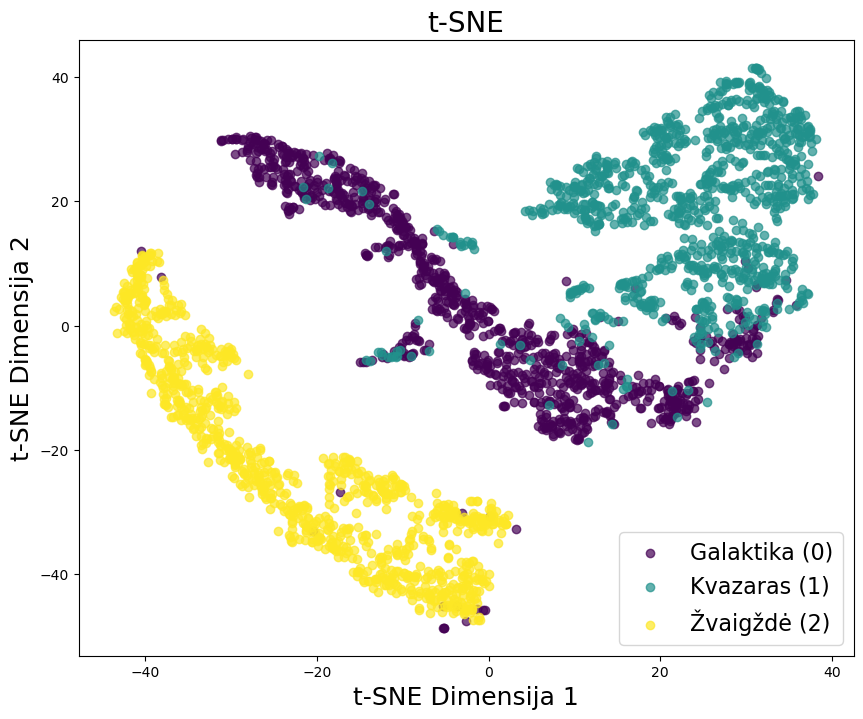

In [7]:
tsne = manifold.TSNE(n_components=2,
    perplexity=50,
    max_iter=750,
    metric='canberra',
    random_state=42)
data_tsne = tsne.fit_transform(dfminmax[feature_cols].values)

plt.figure(figsize=(10, 8))  # Set the figure size

class_labels = ["Galaktika (0)", "Kvazaras (1)", "Žvaigždė (2)"]
class_values = [0, 1, 2]
colors = cm.viridis(np.linspace(0, 1, len(class_values)))

for val, label, color in zip(class_values, class_labels, colors):
    class_mask = dfminmax['class'] == val
    plt.scatter(data_tsne[class_mask, 0], data_tsne[class_mask, 1], color=color, label=label, alpha=0.7)

plt.title("t-SNE", fontsize=20)
plt.xlabel('t-SNE Dimensija 1', fontsize=18)
plt.ylabel('t-SNE Dimensija 2', fontsize=18)
plt.legend(loc="lower right", fontsize=16)

# Show the plot
plt.show()

## Clustering

### KMeans

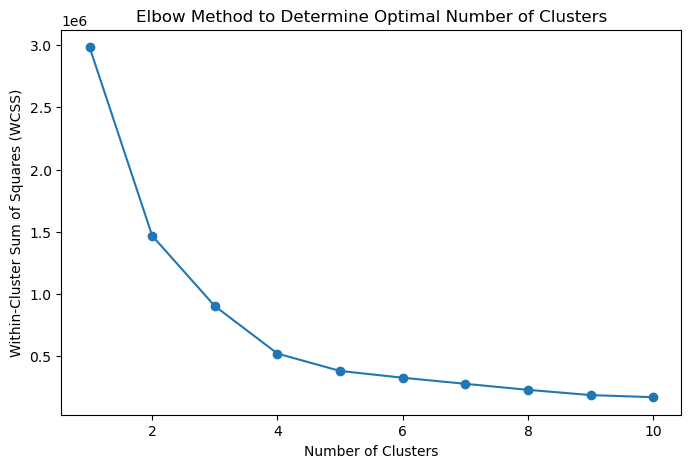

In [18]:
wcss = []  # List to store WCSS values

# Try different numbers of clusters
for n_clusters in range(1, 11):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(data_tsne)
    wcss.append(kmeans.inertia_)

# Plot the WCSS values
plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), wcss, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.title('Elbow Method to Determine Optimal Number of Clusters')
plt.show()


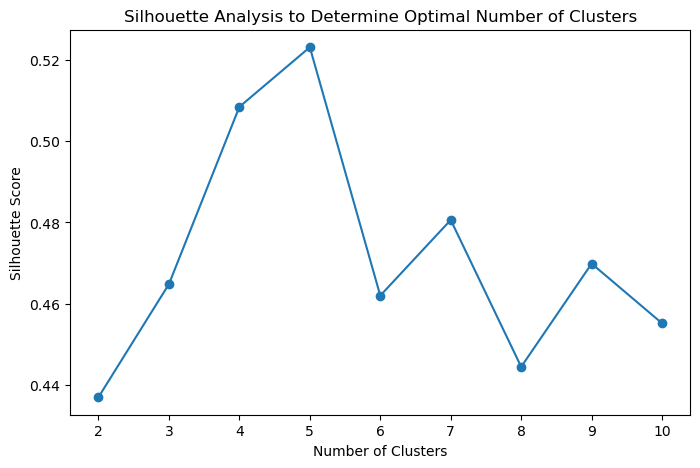

In [21]:
silhouette_scores = []

# Try different numbers of clusters
for n_clusters in range(2, 11):  # Silhouette score is not defined for 1 cluster
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(data_tsne)
    silhouette_scores.append(silhouette_score(data_tsne, labels))

# Plot the Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis to Determine Optimal Number of Clusters')
plt.show()


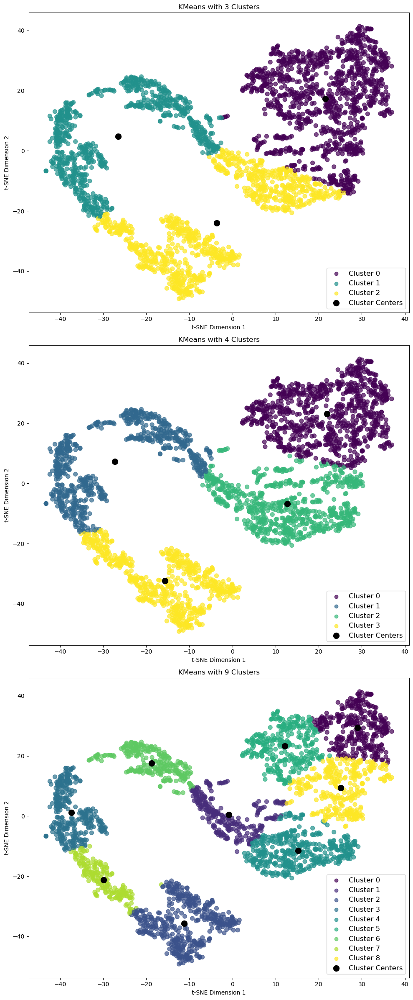

In [20]:
n_clusters = [3, 4, 9]

# Create subplots arranged in three rows and one column
fig, axes = plt.subplots(3, 1, figsize=(10, 24))

for ax, n in zip(axes, n_clusters):
    kmeans = KMeans(n_clusters=n, random_state=42)
    labels = kmeans.fit_predict(data_tsne)
    cluster_centers = kmeans.cluster_centers_
    
    # Plot the scatter plot and use the labels for coloring
    scatter = ax.scatter(data_tsne[:, 0], data_tsne[:, 1], c=labels, cmap='viridis', s=50, alpha=0.7)
    
    # Add a legend for the clusters
    for cluster in range(n):
        ax.scatter([], [], color=scatter.cmap(cluster / (n - 1)), label=f'Cluster {cluster}', alpha=0.7)
    
    ax.scatter(
        cluster_centers[:, 0],
        cluster_centers[:, 1],
        c='black',
        marker='o',
        edgecolor='k',
        s=100,
        label='Cluster Centers'
    )
    ax.set_xlabel('t-SNE Dimension 1')
    ax.set_ylabel('t-SNE Dimension 2')
    ax.set_title(f'KMeans with {n} Clusters')
    ax.legend(loc='lower right', fontsize=12)  # Add the legend

plt.tight_layout()
plt.show()


### DBSCAN

#### Defining functions

In [8]:
def dbscan_plot_one(X, params):
    # Initialize and fit DBSCAN with the provided parameters
    dbscan = DBSCAN(**params)
    labels = dbscan.fit_predict(X)
    
    # Plot the clusters
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis', s=50, alpha=0.7)
    
    # Set title
    plt.title(f"DBSCAN: eps={params['eps']}, min_samples={params['min_samples']}", fontsize=16)
    
    # Add legend if there are fewer than 10 unique labels
    unique_labels = np.unique(labels)
    if len(unique_labels) < 10:
        labels_list = []
        for label in unique_labels:
            if label == -1:
                # Outliers in grey
                labels_list.append(plt.scatter([], [], color='grey', label='Outlier'))
            else:
                # Use the colormap for cluster labels
                color = scatter.cmap(label / (max(unique_labels) if max(unique_labels) > 0 else 1))
                labels_list.append(plt.scatter([], [], color=color, label=f'Cluster {label}'))
        
        # Add legend with labels
        plt.legend(handles=labels_list, loc='lower right')

    # Set axis labels and remove ticks
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.xticks([])
    plt.yticks([])
    
    plt.tight_layout()
    plt.show()

    return labels

def dbscan_plot_2d(X, parameters):
    # Create a figure with six subplots arranged vertically
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    axes = axes.flatten()
    
    # Loop through each set of parameters and corresponding axis
    for ax, params in zip(axes, parameters):
        # Initialize and fit DBSCAN with the current parameters
        dbscan = DBSCAN(**params)
        labels = dbscan.fit_predict(X)
        
        # Plot the clusters
        scatter = ax.scatter(
            X[:, 0], X[:, 1], c=labels, cmap='viridis', s=50, alpha=0.7
        )
        
        # Set title
        ax.set_title(
            f"DBSCAN: eps={params['eps']}, min_samples={params['min_samples']}",
            fontsize=12
        )
        
        # Add legends to each subplot if there are fewer than 10 unique labels
        unique_labels = np.unique(labels)
        if len(unique_labels) < 10:
            # I cant create labels for legend globally somewhy, so I need to add to the list of labels each time seperately
            labels_list = []
            for label in unique_labels:
                if label == -1:
                    # Outliers in grey
                    labels_list.append(ax.scatter([], [], color='grey', label='Outlier'))
                else:
                    # Use the colormap for cluster labels
                    color = scatter.cmap(label / (max(unique_labels) if max(unique_labels) > 0 else 1))
                    labels_list.append(ax.scatter([], [], color=color, label=f'Cluster {label}'))
            
            # Add legend with labels
            ax.legend(handles=labels_list, loc='lower right')
        
        # Set axis labels and remove ticks
        ax.set_xlabel('Feature 1')
        ax.set_ylabel('Feature 2')
        ax.set_xticks([])
        ax.set_yticks([])
    
    plt.tight_layout()
    plt.show()

def dbscan_tsne_plot(X, dbscan_params=None):

    # run DBSCAN
    dbscan = DBSCAN(**dbscan_params)
    labels = dbscan.fit_predict(X)

    # reduce data to 2D using tSNE
    tsne = manifold.TSNE(n_components=2,
                        perplexity=50,
                        max_iter=750,
                        metric='canberra',
                        random_state=42)
    data_tsne = tsne.fit_transform(X)

    # plot the data
    plt.figure(figsize=(12, 8))

    # Number of clusters in labels, ignoring noise if present (-1 label)
    unique_labels = set(labels)
    n_clusters = len(unique_labels) - (1 if -1 in labels else 0)

    # Generate colors for the clusters
    colors = cm.nipy_spectral(np.linspace(0, 1, n_clusters))

    # Plot each cluster
    for k, col in zip(sorted(unique_labels), colors):
        if k == -1:
            # Black color for noise
            col = [0, 0, 0, 1]
            label_name = 'Noise'
        else:
            label_name = f'Cluster {k}'

        class_member_mask = (labels == k)
        xy = data_tsne[class_member_mask]

        plt.scatter(
            xy[:, 0],
            xy[:, 1],
            c=[col],
            label=label_name,
            edgecolors='k',
            alpha=0.7,
            s=50
        )

    plt.title('DBSCAN Clustering with t-SNE Visualization', fontsize=16)
    plt.xlabel('t-SNE Dimension 1', fontsize=14)
    plt.ylabel('t-SNE Dimension 2', fontsize=14)
    plt.legend(loc='best', fontsize=12)
    plt.grid(True)
    plt.show()

    return labels

#### DBSCAN for reduced data

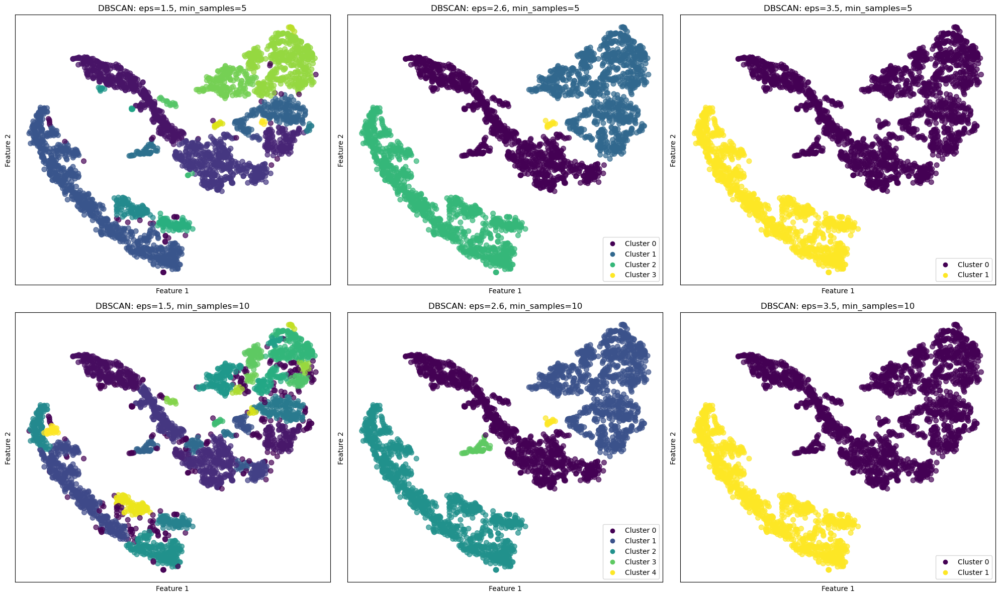

In [9]:
# params for tSNE data 
dbscan_params = [
    {'eps': 1.5, 'min_samples': 5},
    {'eps': 2.6, 'min_samples': 5},
    {'eps': 3.5, 'min_samples': 5}, ## geras
    {'eps': 1.5, 'min_samples': 10},
    {'eps': 2.6, 'min_samples': 10},
    {'eps': 3.5, 'min_samples': 10}
]

dbscan_plot_2d(data_tsne, dbscan_params)

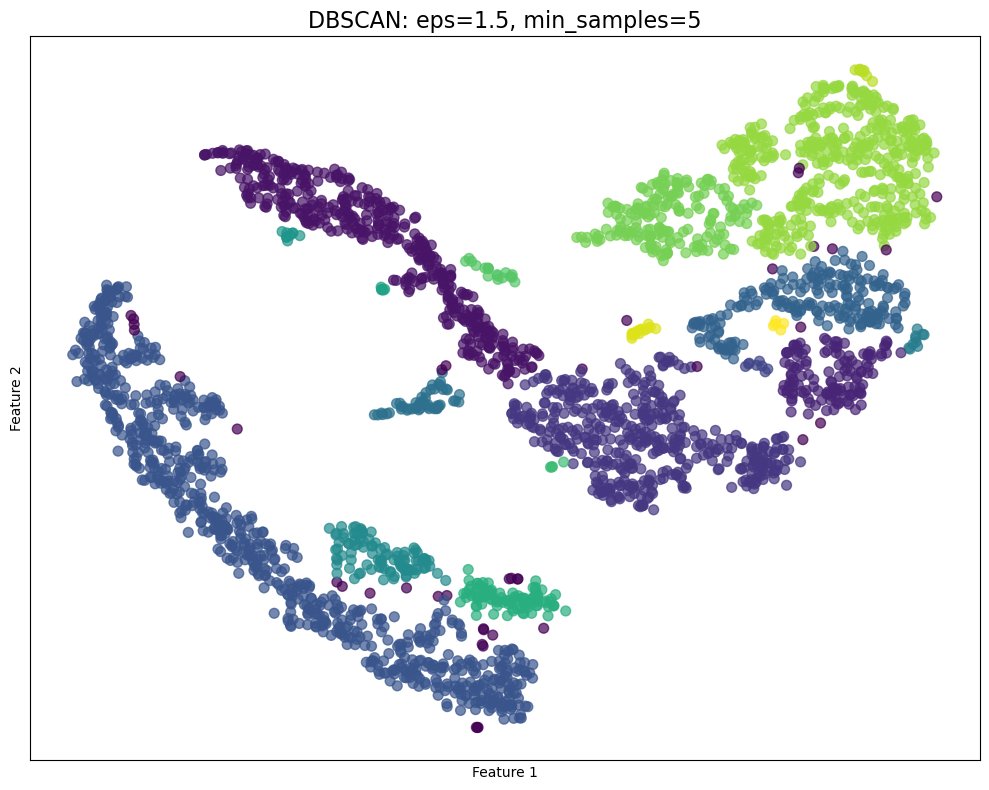

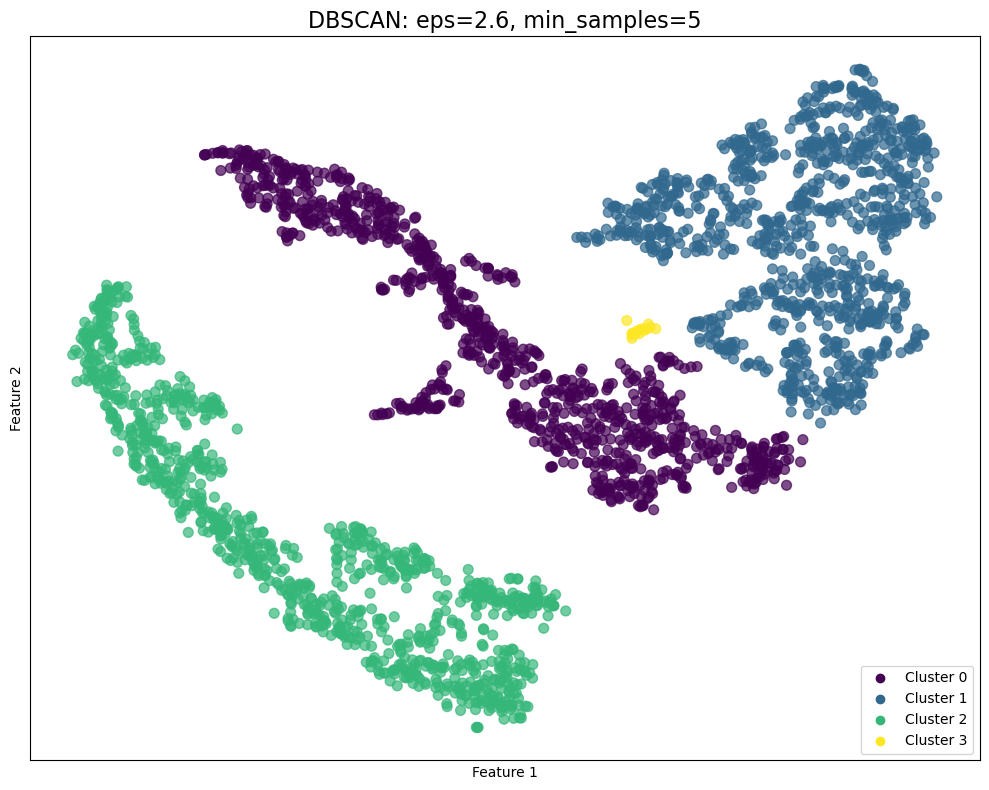

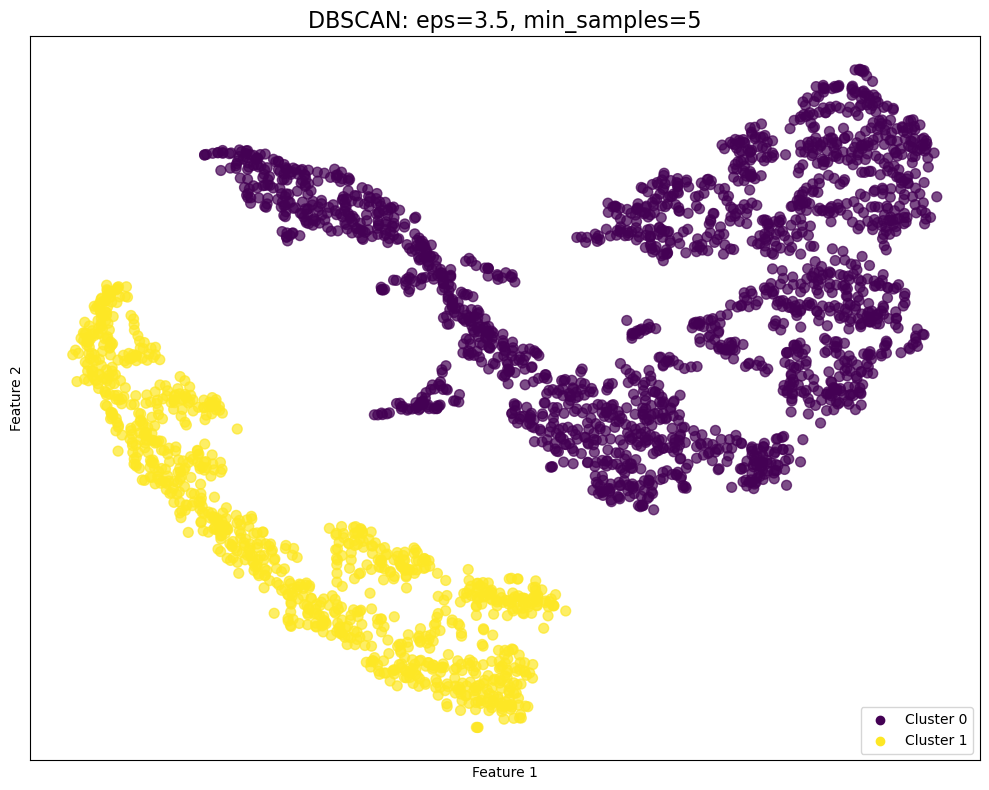

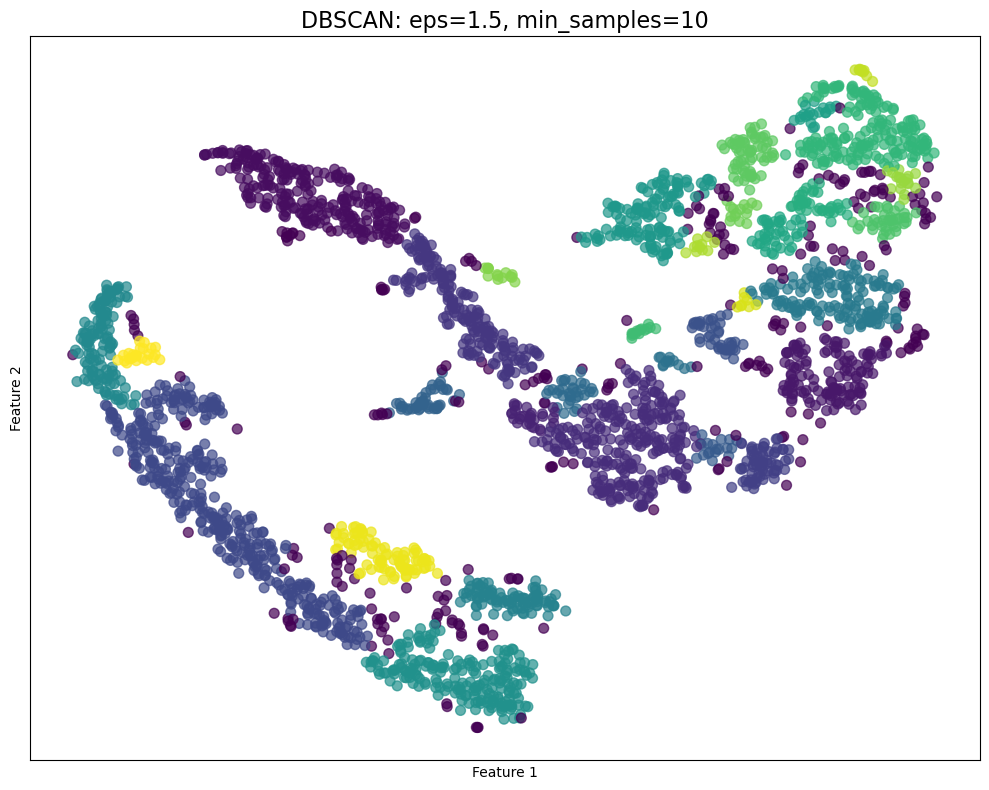

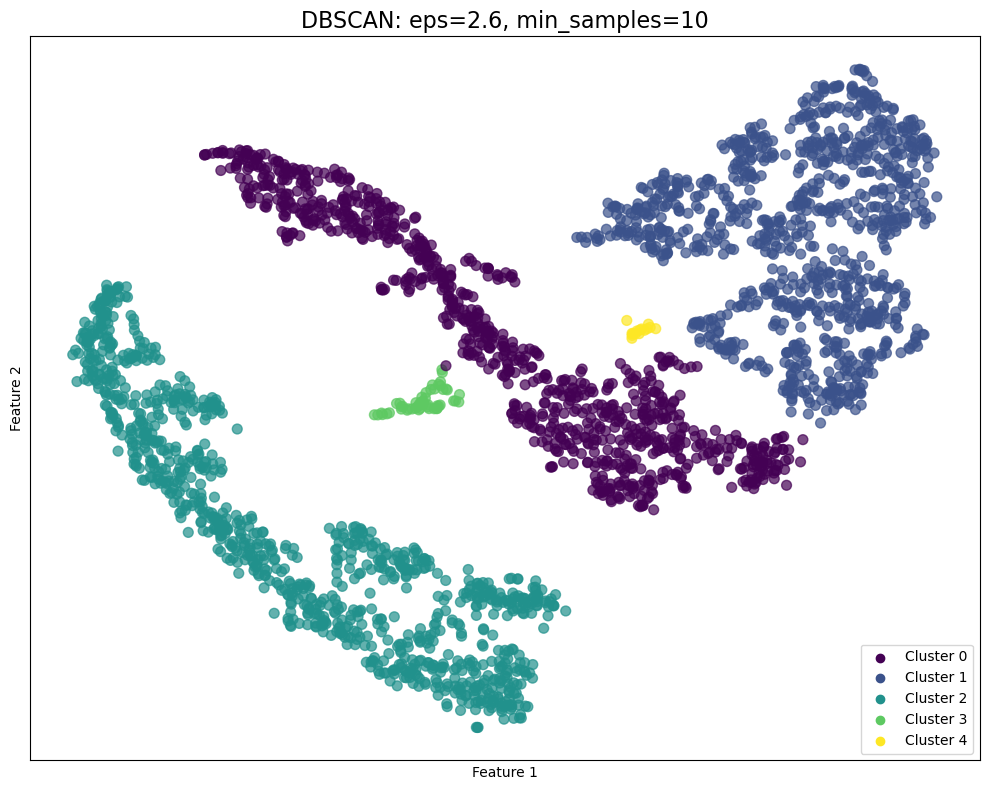

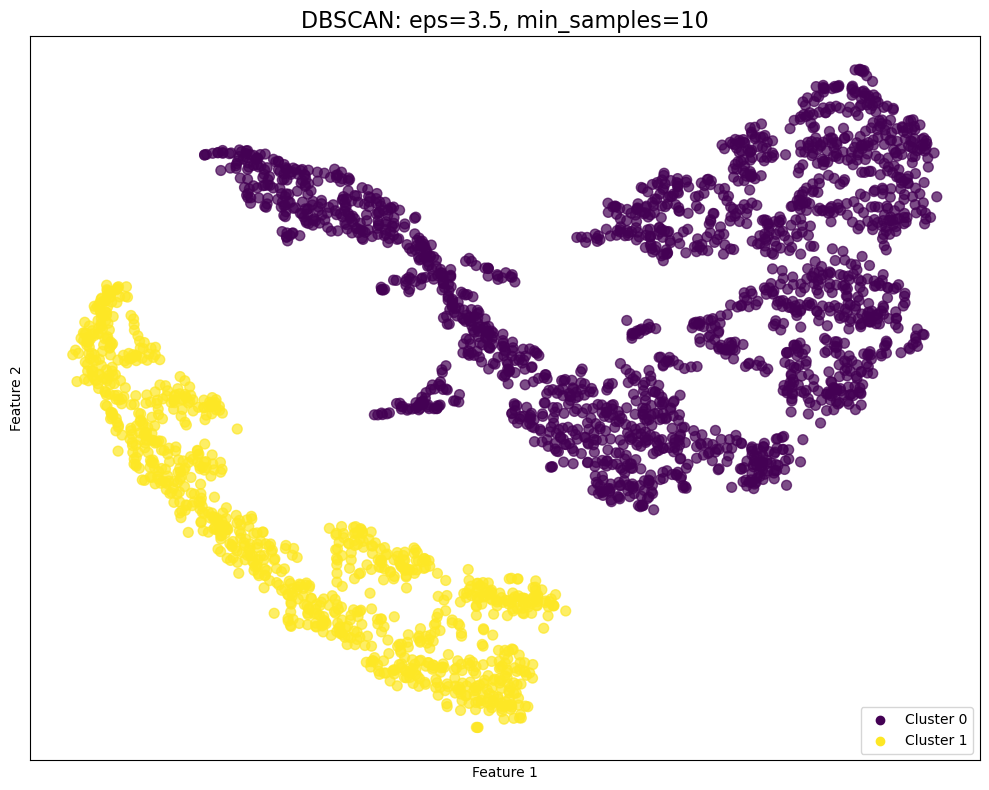

In [10]:
label_list = []
for param in dbscan_params:
    labels = dbscan_plot_one(data_tsne, param)
    label_list.append(labels)

In [11]:
for label in label_list:
    print(np.unique(label))

[-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[0 1 2 3]
[0 1]
[-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25 26 27 28 29 30 31]
[0 1 2 3 4]
[0 1]


#### DBSCAN for not reduced data (cia oof grafikai xd)

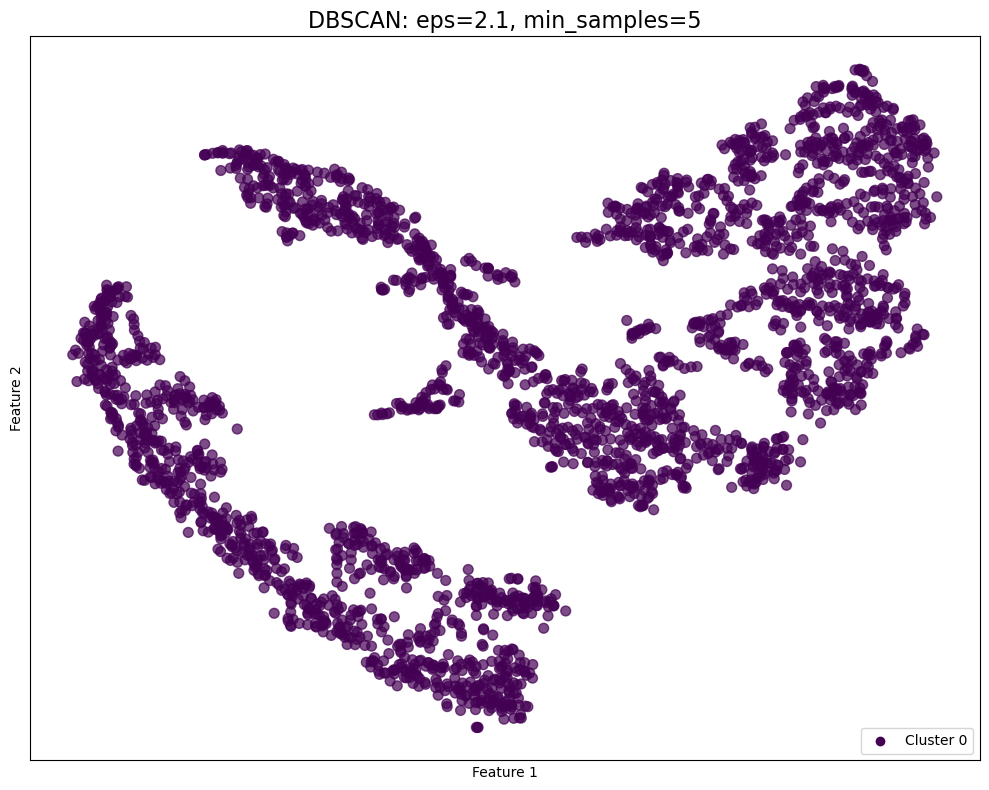

In [12]:
labels = dbscan_plot_one(data_tsne, {'eps': 2.1, 'min_samples': 5, 'metric': 'cosine'})

In [14]:
dbscan_params = {
    'eps': 0.01,
    'min_samples': 5
}

labels = dbscan_tsne_plot(data, dbscan_params)

TypeError: TSNE.__init__() got an unexpected keyword argument 'max_iter'

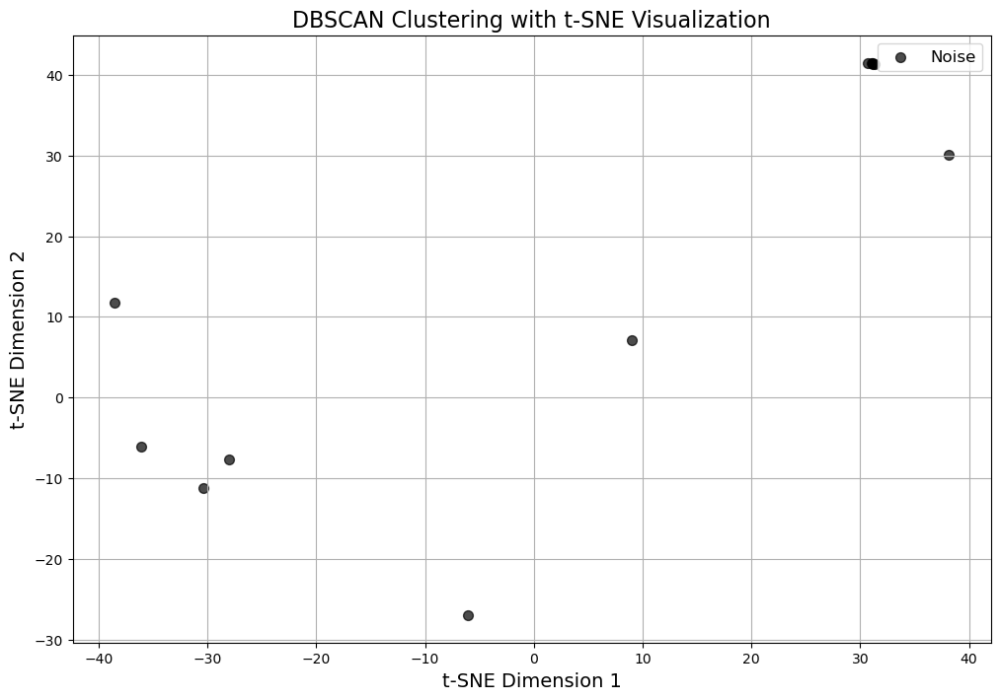

In [126]:
dbscan_params = {
    'eps': 0.25,
    'min_samples': 18
}

labels2 = dbscan_tsne_plot(data, dbscan_params)

In [113]:
np.unique(labels)

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int64)

In [127]:
pd.DataFrame(labels2).value_counts()

0 
 0    2988
-1      12
Name: count, dtype: int64

C:\Users\edvar\AppData\Local\Temp\ipykernel_13464\721575883.py:137: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best', fontsize=12)


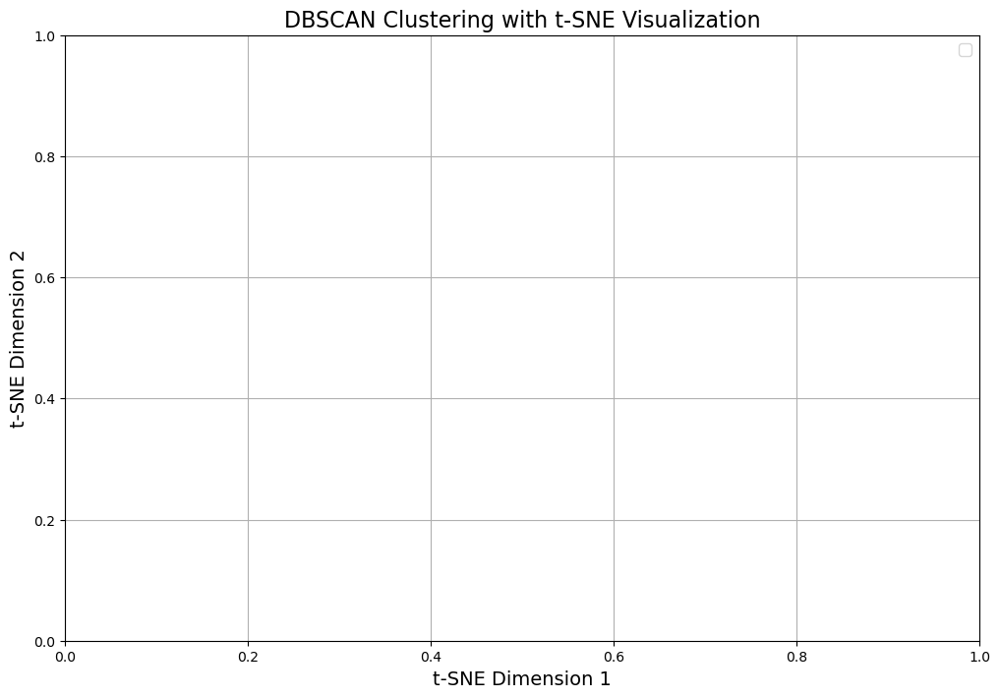

array([-1, -1, -1, ..., -1, -1, -1], dtype=int64)

In [12]:
dbscan_params = {
    'eps': 2,
    'min_samples': 15
}

dbscan_tsne_plot(data_full, dbscan_params)

# neveikia, reikes parodyt, kad ant data_full sitas algo tsg neveikia:D

#### Evaluating clustering results

In [124]:
########## duomenu aibe su atrinktais duomenim ##########
# Finding optimal eps 

scores_list = []

# Finding optimal eps and min_samples
for _eps in np.arange(0.001, 0.25, 0.02):
    for _min_sample in np.arange(2, 20, 2):
        dbscan = DBSCAN(eps=_eps, min_samples=_min_sample)
        labels = dbscan.fit_predict(data)

        # Make sure there is more than one cluster
        if len(set(labels)) > 1:
            sil_score = silhouette_score(data, labels)
            
            # Save the parameters and scores
            scores_list.append({
                'eps': _eps,
                'min_samples': _min_sample,
                'silhouette_score': sil_score,
            })
    print('round done')

scores_df = pd.DataFrame(scores_list)

round done
round done
round done
round done
round done
round done
round done
round done
round done
round done
round done
round done
round done


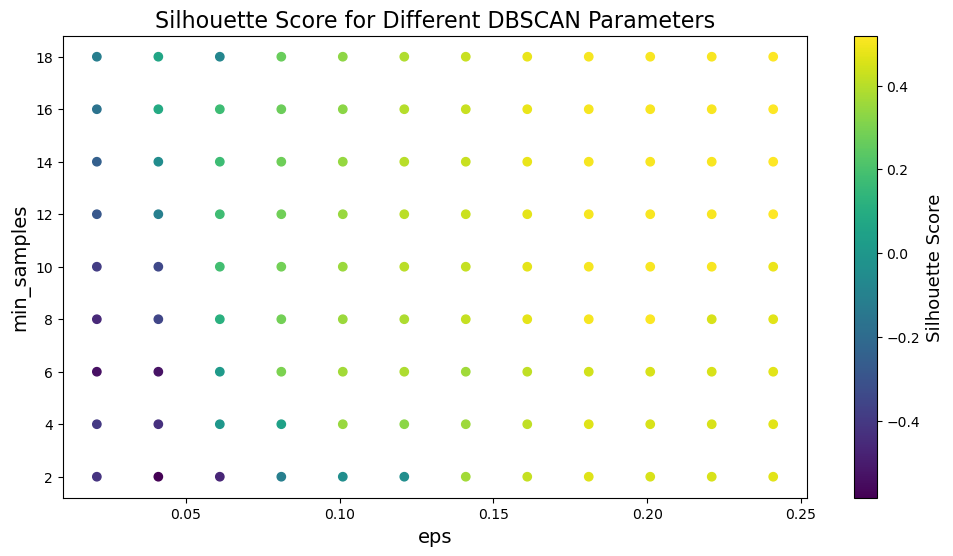

In [125]:
#### PLOTTING SCORES ####
# Plot Silhouette Score
plt.figure(figsize=(12, 6))
scatter = plt.scatter(scores_df['eps'], scores_df['min_samples'], c=scores_df['silhouette_score'], cmap='viridis')
colorbar = plt.colorbar(scatter)
colorbar.set_label('Silhouette Score', fontsize=13)
plt.xlabel('eps', fontsize = 14)
plt.ylabel('min_samples',  fontsize = 14)
plt.title('Silhouette Score for Different DBSCAN Parameters', fontsize = 16)
plt.show()

In [121]:
########## tSNE duomenu aibe ##########
# Finding optimal eps 

scores_list = []

# Finding optimal eps and min_samples
for _eps in np.arange(1.5, 3.25, 0.25):
    for _min_sample in np.arange(2, 20, 2):
        dbscan = DBSCAN(eps=_eps, min_samples=_min_sample)
        labels = dbscan.fit_predict(data_tsne)

        # Make sure there is more than one cluster
        if len(set(labels)) > 1:
            sil_score = silhouette_score(data_tsne, labels)
            
            # Save the parameters and scores
            scores_list.append({
                'eps': _eps,
                'min_samples': _min_sample,
                'silhouette_score': sil_score,
            })
    print('round done')

scores_df = pd.DataFrame(scores_list)

round done
round done
round done
round done
round done
round done
round done


In [122]:
scores_df

,eps,min_samples,silhouette_score
0,1.500000,2,-0.046941
1,1.500000,4,-0.082201
2,1.500000,6,0.030578
3,1.500000,8,0.106989
4,1.500000,10,0.171958
...,...,...,...
58,3.000000,10,0.150193
59,3.000000,12,0.150178
60,3.000000,14,0.043829
61,3.000000,16,-0.056894


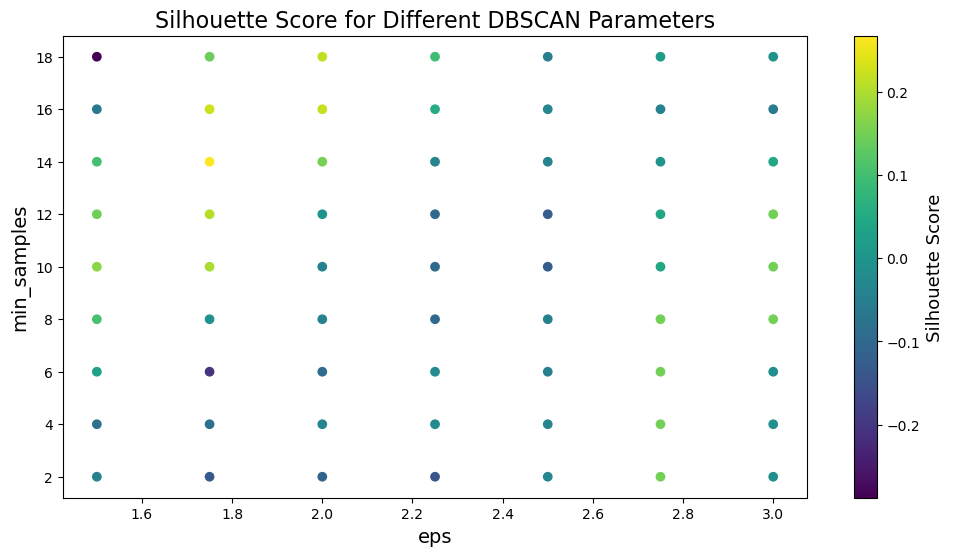

In [123]:
#### PLOTTING SCORES ####
# Plot Silhouette Score
plt.figure(figsize=(12, 6))
scatter = plt.scatter(scores_df['eps'], scores_df['min_samples'], c=scores_df['silhouette_score'], cmap='viridis')
colorbar = plt.colorbar(scatter)
colorbar.set_label('Silhouette Score', fontsize=13)
plt.xlabel('eps', fontsize = 14)
plt.ylabel('min_samples',  fontsize = 14)
plt.title('Silhouette Score for Different DBSCAN Parameters', fontsize = 16)
plt.show()

In [18]:
########## NORMAL DATA ##########
# Finding optimal eps 
for _eps in np.arange(0.05, 1.0, 0.05):
    _eps = round(_eps, 2)
    
    dbscan = DBSCAN(eps=_eps, min_samples=5)
    labels = dbscan.fit_predict(data)
    
    # Calculate the Silhouette Score (ignoring noise points labeled as -1)
    if len(set(labels)) > 1:  # Make sure there is more than one cluster
        score = silhouette_score(data, labels)
        print(f"DBSCAN with eps={_eps}, min_samples=5 - Silhouette Score: {score:.3f}")
    else:
        print(f"DBSCAN with eps={_eps}, min_samples=5 - 1 cluster detected.")

# Finding optimal min_sample
for _min_sample in np.arange(2, 50, 10):
    dbscan = DBSCAN(eps=0.05, min_samples=_min_sample)
    labels = dbscan.fit_predict(data)
    
    # Calculate the Silhouette Score (ignoring noise points labeled as -1)
    if len(set(labels)) > 1:  # Make sure there is more than one cluster
        score = silhouette_score(data, labels)
        print(f"eps=0.6, min_samples={_min_sample} - Silhouette Score: {score:.3f}")
    else:
        print(f"eps=0.05, min_samples={_min_sample} - 1 cluster detected.")


DBSCAN with eps=0.05, min_samples=5 - Silhouette Score: -0.052
DBSCAN with eps=0.1, min_samples=5 - Silhouette Score: 0.370
DBSCAN with eps=0.15, min_samples=5 - Silhouette Score: 0.380
DBSCAN with eps=0.2, min_samples=5 - Silhouette Score: 0.473
DBSCAN with eps=0.25, min_samples=5 - Silhouette Score: 0.469
DBSCAN with eps=0.3, min_samples=5 - Silhouette Score: 0.477
DBSCAN with eps=0.35, min_samples=5 - Silhouette Score: 0.532
DBSCAN with eps=0.4, min_samples=5 - Silhouette Score: 0.435
DBSCAN with eps=0.45, min_samples=5 - Silhouette Score: 0.435
DBSCAN with eps=0.5, min_samples=5 - 1 cluster detected.
DBSCAN with eps=0.55, min_samples=5 - 1 cluster detected.
DBSCAN with eps=0.6, min_samples=5 - 1 cluster detected.
DBSCAN with eps=0.65, min_samples=5 - 1 cluster detected.
DBSCAN with eps=0.7, min_samples=5 - 1 cluster detected.
DBSCAN with eps=0.75, min_samples=5 - 1 cluster detected.
DBSCAN with eps=0.8, min_samples=5 - 1 cluster detected.
DBSCAN with eps=0.85, min_samples=5 - 1 clu

In [19]:
########## FULL DATA ##########
for _eps in np.arange(0.1, 10.0, 0.5):
    #_eps = round(_eps, 2)
    
    dbscan = DBSCAN(eps=_eps, min_samples=100)
    labels = dbscan.fit_predict(data_full)
    
    # Calculate the Silhouette Score (ignoring noise points labeled as -1)
    if len(set(labels)) > 1:  # Make sure there is more than one cluster
        score = silhouette_score(data_full, labels)
        print(f"DBSCAN with eps={_eps}, min_samples=5 - Silhouette Score: {score:.3f}")
    else:
        print(f"DBSCAN with eps={_eps}, min_samples=5 - Only one cluster detected, score not applicable.")

### Tried calculating with different min_samples (2, 4, 10, 20, 100) and different eps (from 0.01 to 10.0) and clustering always fails

DBSCAN with eps=0.1, min_samples=5 - Only one cluster detected, score not applicable.
DBSCAN with eps=0.6, min_samples=5 - Only one cluster detected, score not applicable.
DBSCAN with eps=1.1, min_samples=5 - Only one cluster detected, score not applicable.
DBSCAN with eps=1.6, min_samples=5 - Only one cluster detected, score not applicable.
DBSCAN with eps=2.1, min_samples=5 - Only one cluster detected, score not applicable.
DBSCAN with eps=2.6, min_samples=5 - Only one cluster detected, score not applicable.
DBSCAN with eps=3.1, min_samples=5 - Only one cluster detected, score not applicable.
DBSCAN with eps=3.6, min_samples=5 - Only one cluster detected, score not applicable.
DBSCAN with eps=4.1, min_samples=5 - Only one cluster detected, score not applicable.
DBSCAN with eps=4.6, min_samples=5 - Only one cluster detected, score not applicable.
DBSCAN with eps=5.1, min_samples=5 - Only one cluster detected, score not applicable.
DBSCAN with eps=5.6, min_samples=5 - Only one cluster 

#### Analysing best plots

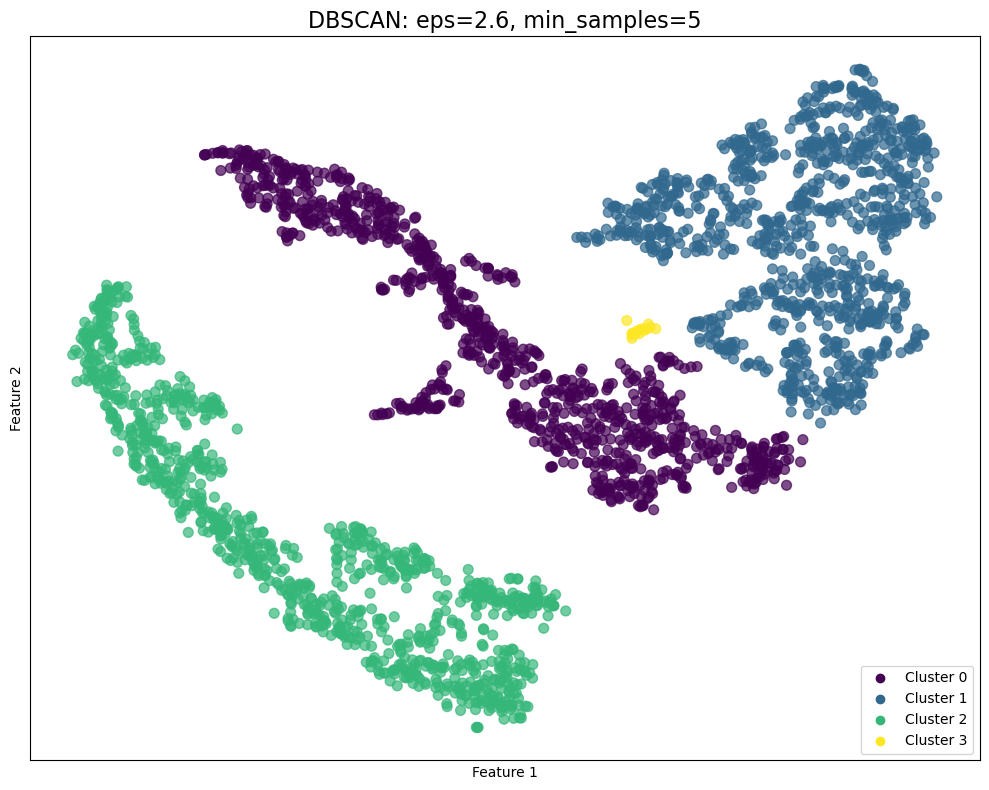

In [26]:
dbscan_labels = dbscan_plot_one(data_tsne, {'eps': 2.6, 'min_samples': 5})

In [45]:
df_tsne = pd.DataFrame(data_tsne, columns=['feature1', 'feature2'])
df_tsne['class'] = dfminmax['class']
df_tsne['cluster_label'] = dbscan_labels
df_tsne.value_counts('cluster_label')

cluster_label
2    1016
1     992
0     977
3      15
Name: count, dtype: int64

In [46]:
df_tsne_different = df_tsne[df_tsne['class'] != df_tsne['cluster_label']]
df_tsne_different.value_counts('class')

class
0    99
1    90
Name: count, dtype: int64

In [33]:
df_tsne_different.value_counts('cluster_label')

cluster_label
1    82
0    76
2    16
3    15
Name: count, dtype: int64

In [34]:
df_tsne_different.value_counts('cluster_label').sum()

189

In [35]:
dfminmax['cluster_label'] = df_tsne['cluster_label']
dfminmax[dfminmax['cluster_label'] == 3].describe()

,u,g,r,i,z,run_ID,cam_col,field_ID,class,redshift,plate,fiber_ID,cluster_label
count,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000
mean,0.449222,0.527594,0.517511,0.579911,0.650867,4869.466667,3.400000,243.800000,0.933333,0.074971,6256.866667,330.133333,3.000000
std,0.031992,0.038963,0.133875,0.018296,0.029074,2477.506116,1.882248,207.781204,0.258199,0.011325,2659.998681,227.282350,0.000000
min,0.350644,0.398850,0.459111,0.532837,0.560451,752.000000,1.000000,26.000000,0.000000,0.058443,453.000000,3.000000,3.000000
25%,0.439345,0.522957,0.478665,0.573414,0.644151,3225.000000,2.000000,86.500000,1.000000,0.066950,3959.000000,133.500000,3.000000
50%,0.453116,0.534666,0.484500,0.585209,0.657056,4849.000000,3.000000,232.000000,1.000000,0.074081,6722.000000,266.000000,3.000000
75%,0.470446,0.546072,0.488799,0.590631,0.669469,7145.000000,5.000000,281.500000,1.000000,0.082581,7978.000000,521.500000,3.000000
max,0.482341,0.569880,1.000000,0.609719,0.675547,8108.000000,6.000000,755.000000,1.000000,0.092676,9379.000000,635.000000,3.000000


In [36]:
dfminmax[dfminmax['class'] == 0].describe()

,u,g,r,i,z,run_ID,cam_col,field_ID,class,redshift,plate,fiber_ID,cluster_label
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.608109,0.613115,0.486420,0.542912,0.607297,4549.487000,3.541000,186.304000,0.000000,0.060010,4911.784000,431.707000,0.117000
std,0.137202,0.128581,0.099361,0.149273,0.126699,1973.455915,1.618932,151.778741,0.000000,0.038416,2834.056126,274.516809,0.376102
min,0.209639,0.198465,0.150432,0.000000,0.149931,752.000000,1.000000,11.000000,0.000000,0.000000,266.000000,1.000000,0.000000
25%,0.501321,0.494530,0.394296,0.413123,0.502322,3225.000000,2.000000,76.750000,0.000000,0.023000,2346.750000,191.000000,0.000000
50%,0.620519,0.653076,0.513663,0.576766,0.630580,4263.000000,4.000000,148.000000,0.000000,0.063665,4794.000000,405.000000,0.000000
75%,0.706708,0.708529,0.558693,0.641436,0.684100,5330.000000,5.000000,237.250000,0.000000,0.086059,6826.500000,626.000000,0.000000
max,0.903524,1.000000,1.000000,0.902262,0.980840,8162.000000,6.000000,842.000000,0.000000,0.287693,11565.000000,999.000000,3.000000


#### Plot (in)correctly assigned points

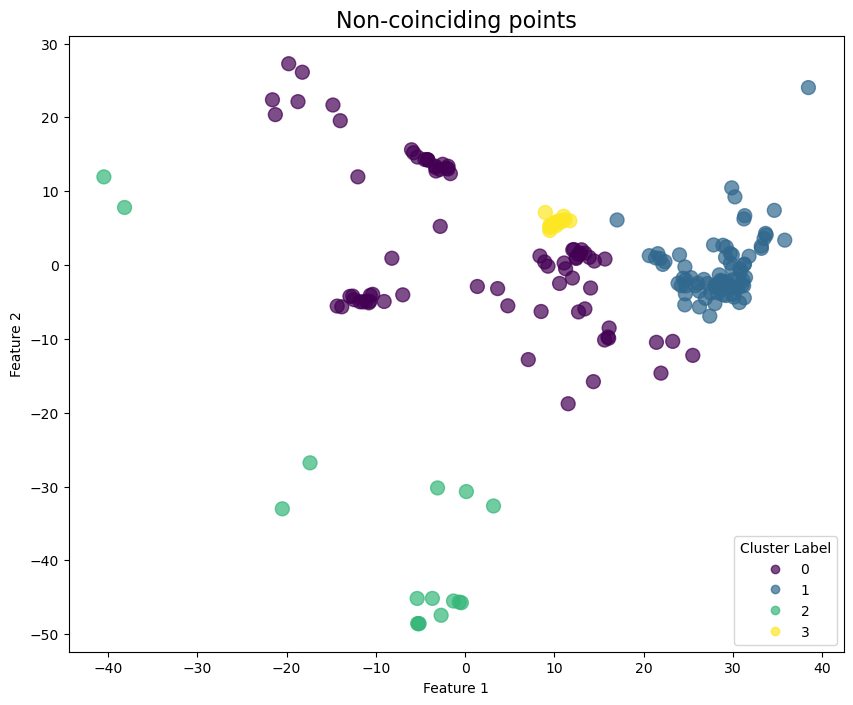

In [38]:
df_tsne_different = df_tsne[df_tsne['label'] != df_tsne['cluster_label']]
plt.figure(figsize=(10, 8))

plt.title(f"Non-coinciding points", fontsize=16)
scatter = plt.scatter(df_tsne_different['feature1'], df_tsne_different['feature2'], c=df_tsne_different['cluster_label'], cmap='viridis', s=100, alpha=0.7)
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
handles, labels = scatter.legend_elements()
plt.legend(handles, labels, loc='lower right', title="Cluster Label")

In [44]:
df_orig.head()

,u,g,r,i,z,run_ID,cam_col,field_ID,class,redshift,plate,fiber_ID
0,23.878820,22.275300,20.395010,19.165730,18.793710,3606,2,79,0,0.634794,5812,171
1,24.777590,22.831880,22.584440,21.168120,21.614270,4518,5,119,0,0.779136,10445,427
2,25.263070,22.663890,20.609760,19.348570,18.948270,3606,2,120,0,0.644195,4576,299
3,22.136820,23.776560,21.611620,20.504540,19.250100,4192,3,214,0,0.932346,9149,775
4,19.437180,17.580280,16.497470,15.977110,15.544610,8102,3,137,0,0.116123,6121,842


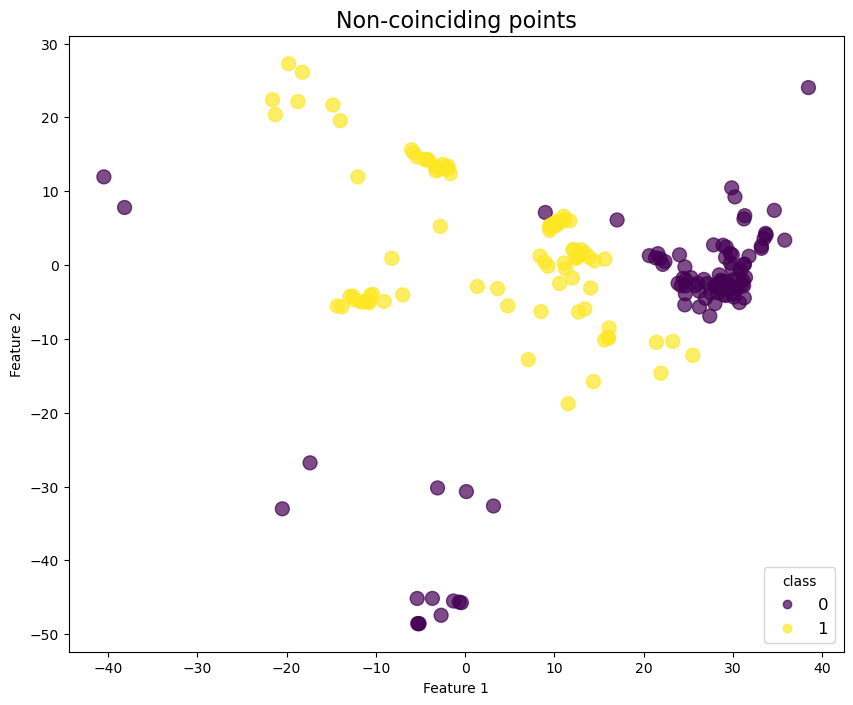

In [50]:
df_tsne_different = df_tsne[df_tsne['class'] != df_tsne['cluster_label']]
plt.figure(figsize=(10, 8))

plt.title(f"Non-coinciding points", fontsize=16)
scatter = plt.scatter(df_tsne_different['feature1'], df_tsne_different['feature2'], c=df_tsne_different['class'], cmap='viridis', s=100, alpha=0.7)
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
handles, labels = scatter.legend_elements()
plt.legend(handles, labels, loc='lower right', title="class", fontsize=12)

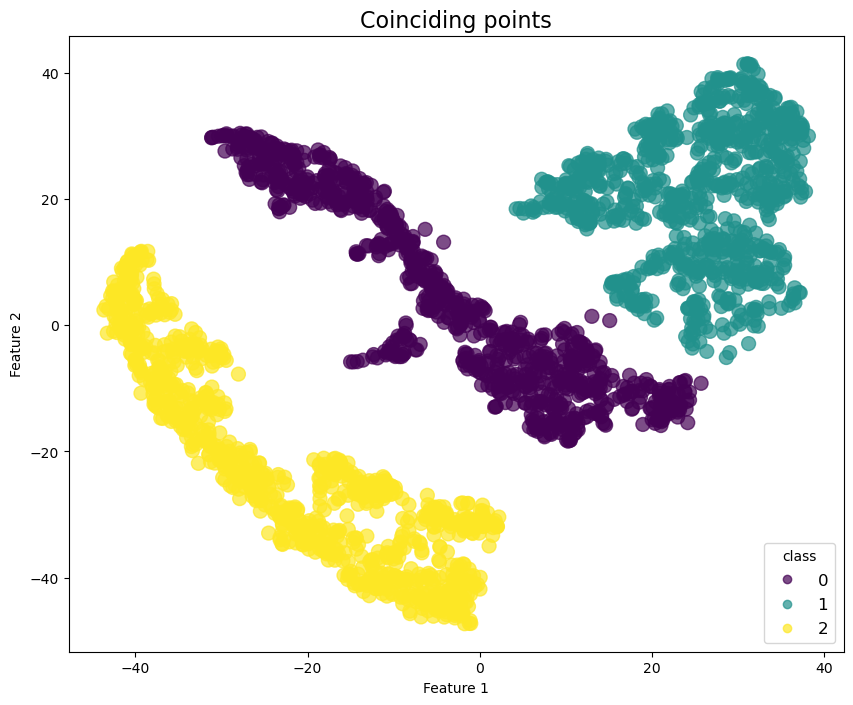

In [51]:
df_tsne_same = df_tsne[df_tsne['class'] == df_tsne['cluster_label']]
plt.figure(figsize=(10, 8))

plt.title(f"Coinciding points", fontsize=16)
scatter = plt.scatter(df_tsne_same['feature1'], df_tsne_same['feature2'], c=df_tsne_same['class'], cmap='viridis', s=100, alpha=0.7)
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
handles, labels = scatter.legend_elements()
plt.legend(handles, labels, loc='lower right', title="class", fontsize=12)

#### Krc cia esme visai speju galimai bus:

In [56]:
dfminmax['cluster_label'] = df_tsne['cluster_label']

In [57]:
dfminmax.head()

,u,g,r,i,z,run_ID,cam_col,field_ID,class,redshift,plate,fiber_ID,cluster_label,incorrect_labels
0,0.472420,0.452587,0.355507,0.343505,0.437653,5935,3,137,0,0.022134,2436,293,0,61.000000
1,0.629652,0.728584,0.622757,0.752772,0.819195,3606,4,59,0,0.121789,10431,239,1,82.000000
2,0.509006,0.491625,0.387103,0.398747,0.488507,4649,3,123,0,0.026182,1978,312,0,13.000000
3,0.742699,0.664597,0.512352,0.571179,0.629524,7765,4,47,0,0.069007,4077,477,0,52.000000
4,0.619601,0.709254,0.536190,0.600915,0.658788,3177,4,339,0,0.074683,4177,693,0,15.000000


In [58]:
dfminmax['incorrect_labels'] = dfminmax[dfminmax['class'] != dfminmax['cluster_label']].value_counts('cluster_label')

In [1]:
plt.figure(figsize=(8, 10))
# Create boxplots for 'redshift' grouped by 'cluster_label' and 'class'
plt.figure(figsize=(14, 6))

# Boxplot for 'redshift' by 'cluster_label'
plt.subplot(1, 2, 1)
sns.boxplot(x=dfminmax['cluster_label'], y=dfminmax['redshift'])
plt.title("Redshift by Cluster Label")
plt.xlabel("Cluster Label")
plt.ylabel("Redshift")

# Boxplot for 'redshift' by 'class'
plt.subplot(1, 2, 2)
sns.boxplot(x=dfminmax['class'], y=dfminmax['redshift'])
plt.title("Redshift by Class")
plt.xlabel("Class")
plt.ylabel("Redshift")

plt.tight_layout()
plt.show()



NameError: name 'plt' is not defined

In [31]:
df_outliers = dfminmax[dfminmax['class'] != dfminmax['cluster_label']]

In [32]:
df_outliers.loc[df_outliers['class'] == 2, 'redshift'].mean(), df_outliers.loc[df_outliers['cluster_label'] == 2, 'redshift'].mean()

(0.0008161859534099281, 0.0008448733876021397)

#### Jei butu daugiau reiksmiu butu belekoks palyginimas cia gautas

In [ ]:
# ok cia pas mane nelabai kas yra daryti ig, bet tipo galima pastebeti, kad redshift = 0 arba labai labai maza reiksme
sns.boxplot(x=dfminmax['class'], y=dfminmax['redshift'])

In [ ]:
sns.boxplot(x=df_outliers['class'], y=df_outliers['redshift'])

In [ ]:
sns.boxplot(x=df_outliers['cluster_label'], y=df_outliers['redshift'])

In [ ]:
sns.boxplot(x=dfminmax['class'], y=dfminmax['i'])

In [ ]:
sns.boxplot(x=df_outliers['class'], y=df_outliers['i'])

In [298]:
#### normal data analysing

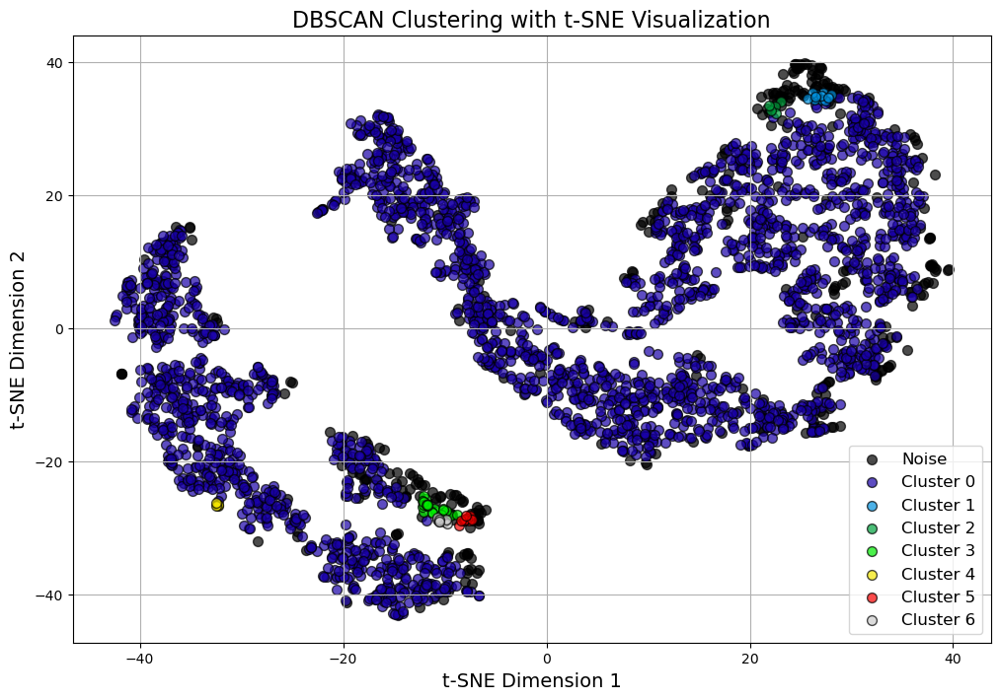

In [9]:
dbscan_params = {
    'eps': 0.01,
    'min_samples': 5
}

labels = dbscan_tsne_plot(data, dbscan_params)

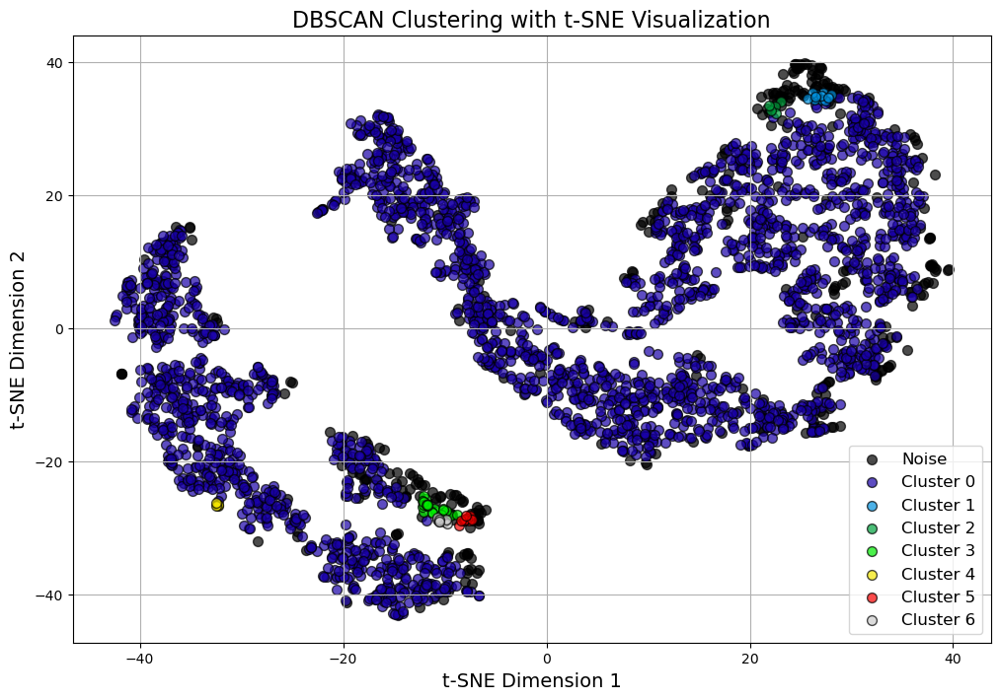

In [11]:
dbscan_params = {
    'eps': 0.05,
    'min_samples': 5,
    'leaf_size': 25
}

labels2 = dbscan_tsne_plot(data, dbscan_params)

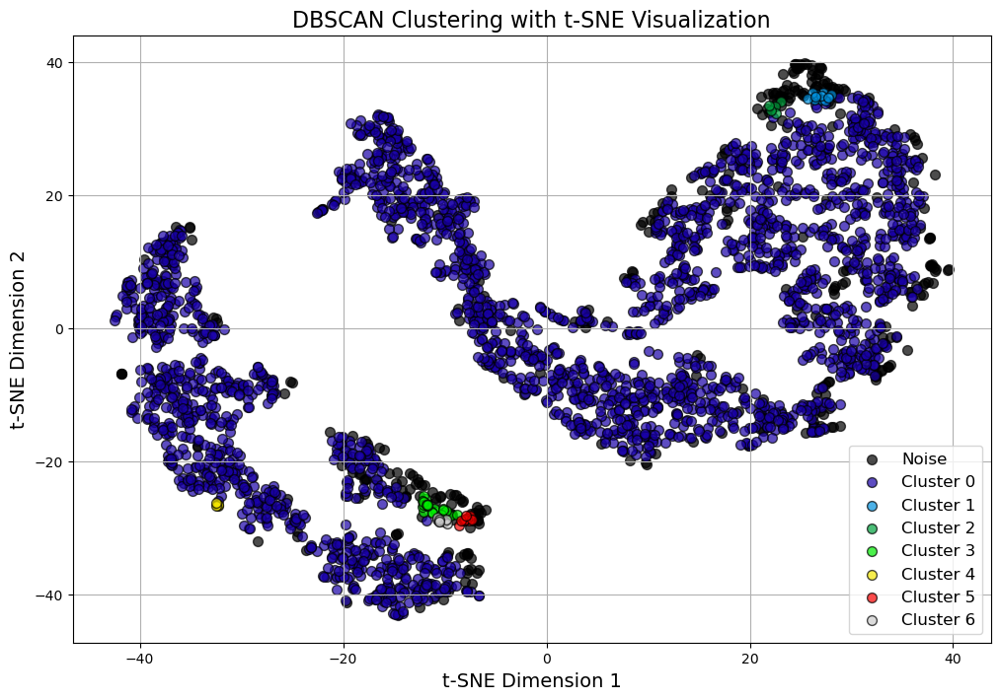

In [12]:
dbscan_params = {
    'eps': 0.05,
    'min_samples': 5,
    'leaf_size': 35
}

labels2 = dbscan_tsne_plot(data, dbscan_params)

In [305]:
df_tsne = pd.DataFrame(data_tsne, columns=['feature1', 'feature2'])
df_tsne['label'] = dfminmax['class']
df_tsne['cluster_label'] = labels
df_tsne.value_counts('cluster_label')

cluster_label
 0    2650
-1     341
 2       5
 1       4
Name: count, dtype: int64

In [307]:
dfminmax['cluster_label'] = df_tsne['cluster_label']

<Figure size 800x1000 with 0 Axes>

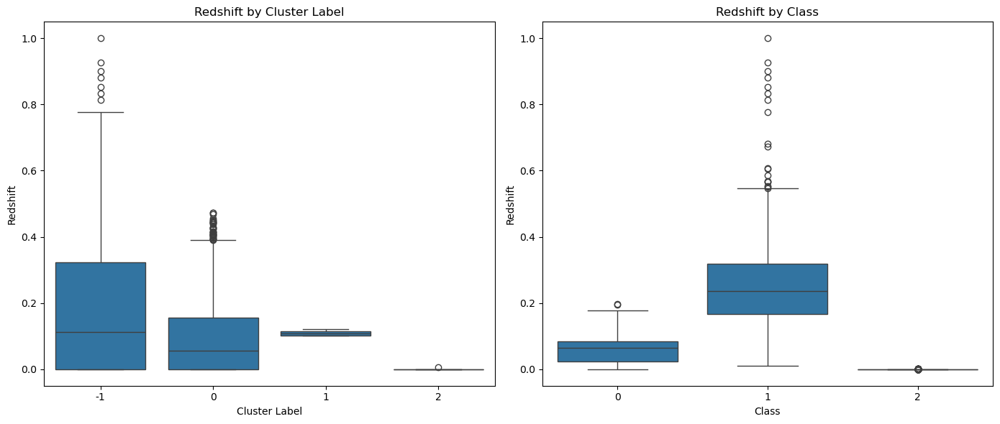

In [313]:
plt.figure(figsize=(8, 10))
# Create boxplots for 'redshift' grouped by 'cluster_label' and 'class'
plt.figure(figsize=(14, 6))

# Boxplot for 'redshift' by 'cluster_label'
plt.subplot(1, 2, 1)
sns.boxplot(x=dfminmax['cluster_label'], y=dfminmax['redshift'])
plt.title("Redshift by Cluster Label")
plt.xlabel("Cluster Label")
plt.ylabel("Redshift")

# Boxplot for 'redshift' by 'class'
plt.subplot(1, 2, 2)
sns.boxplot(x=dfminmax['class'], y=dfminmax['redshift'])
plt.title("Redshift by Class")
plt.xlabel("Class")
plt.ylabel("Redshift")

plt.tight_layout()
plt.show()



### Trying with DBSCAN + PCA (lol its bad)

In [80]:
def pca_dbscan_plot(X, dbscan_params=None, n_components=2):

    # Step 2: Reduce dimensions using PCA
    pca = PCA(n_components=n_components, random_state=42)
    X_pca = pca.fit_transform(X)

    # Step 3: Run DBSCAN clustering on reduced data
    if dbscan_params is None:
        dbscan_params = {'eps': 0.5, 'min_samples': 5}
    dbscan = DBSCAN(**dbscan_params)
    labels = dbscan.fit_predict(X_pca)

    # Step 4: Plot the clusters
    plt.figure(figsize=(12, 8))
    unique_labels = np.unique(labels)
    colors = plt.cm.nipy_spectral(np.linspace(0, 1, len(unique_labels)))

    for label, color in zip(unique_labels, colors):
        class_member_mask = (labels == label)
        xy = X_pca[class_member_mask]
        if label == -1:
            plt.scatter(xy[:, 0], xy[:, 1], c='k', label='Noise', alpha=0.5)
        else:
            plt.scatter(xy[:, 0], xy[:, 1], c=[color], label=f'Cluster {label}', alpha=0.7)

    plt.title('DBSCAN Clustering on PCA-Reduced Data')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    #plt.legend(loc='best')
    plt.grid(True)
    plt.show()

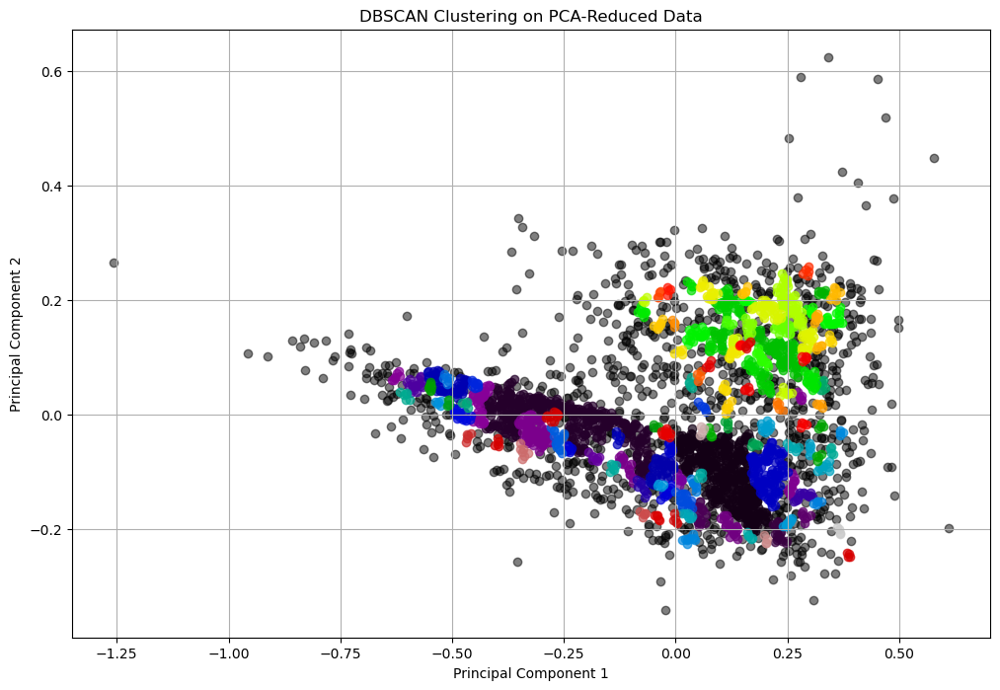

In [96]:
from sklearn.decomposition import PCA
pca_dbscan_plot(data, {'eps': 0.01, 'min_samples': 4})

### GaussianMixture

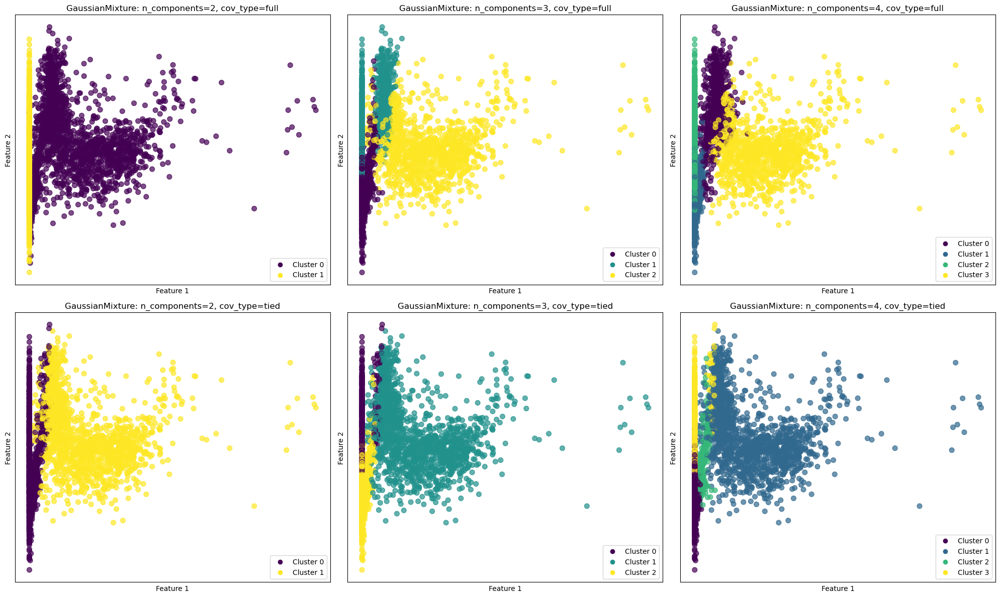

In [17]:
# Define different parameters for GaussianMixture
gmm_params = [
    {'n_components': 2, 'covariance_type': 'full'},
    {'n_components': 3, 'covariance_type': 'full'},
    {'n_components': 4, 'covariance_type': 'full'},
    {'n_components': 2, 'covariance_type': 'tied'},
    {'n_components': 3, 'covariance_type': 'tied'},
    {'n_components': 4, 'covariance_type': 'tied'}
]

# Create a figure with six subplots arranged in a 2x3 grid
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

# Loop through each set of parameters and corresponding axis
for ax, params in zip(axes, gmm_params):
    # Initialize and fit GaussianMixture with the current parameters
    gmm = GaussianMixture(**params)
    gmm.fit(data_tsne)
    labels = gmm.predict(data_tsne)
    
    # Plot the clusters
    scatter = ax.scatter(
        data[:, 0], data[:, 1], c=labels, cmap='viridis', s=50, alpha=0.7
    )
    
    # Set title
    ax.set_title(
        f"GaussianMixture: n_components={params['n_components']}, "
        f"cov_type={params['covariance_type']}",
        fontsize=12
    )
    
    # Add legends to each subplot if there are fewer than 10 unique labels
    unique_labels = np.unique(labels)
    if len(unique_labels) < 10:
        # Create a list to store the handles and labels
        labels_list = []
        for label in unique_labels:
            color = scatter.cmap(label / (max(unique_labels) if max(unique_labels) > 0 else 1))
            labels_list.append(ax.scatter([], [], color=color, label=f'Cluster {label}'))
        
        # Add legend with labels
        ax.legend(handles=labels_list, loc='lower right')
    
    # Set axis labels and remove ticks
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()


### Agglomerative Clustering (Hierarchical Clustering)

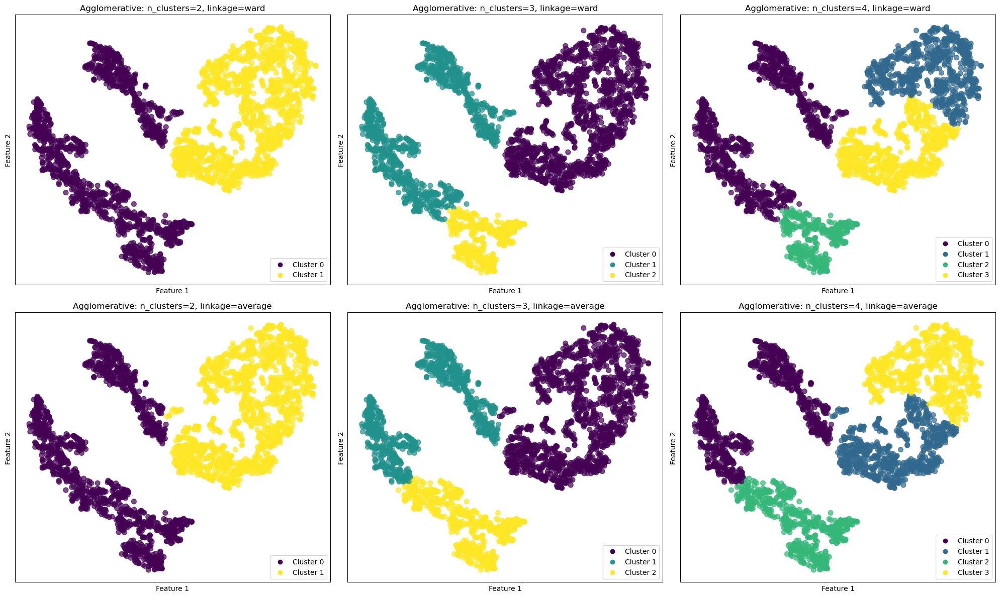

In [215]:
# Define different parameters for AgglomerativeClustering
agglo_params = [
    {'n_clusters': 2, 'linkage': 'ward'},
    {'n_clusters': 3, 'linkage': 'ward'},
    {'n_clusters': 4, 'linkage': 'ward'},
    {'n_clusters': 2, 'linkage': 'average'},
    {'n_clusters': 3, 'linkage': 'average'},
    {'n_clusters': 4, 'linkage': 'average'}
]

# Create a figure with six subplots arranged in a 2x3 grid
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

# Loop through each set of parameters and corresponding axis
for ax, params in zip(axes, agglo_params):
    # Initialize and fit AgglomerativeClustering with the current parameters
    agglo = AgglomerativeClustering(**params)
    labels = agglo.fit_predict(data)
    
    # Plot the clusters
    scatter = ax.scatter(
        data[:, 0], data[:, 1], c=labels, cmap='viridis', s=50, alpha=0.7
    )
    
    # Set title
    ax.set_title(
        f"Agglomerative: n_clusters={params['n_clusters']}, linkage={params['linkage']}",
        fontsize=12
    )
    
    # Add legends to each subplot if there are fewer than 10 unique labels
    unique_labels = np.unique(labels)
    if len(unique_labels) < 10:
        # Create a list to store the handles and labels
        labels_list = []
        for label in unique_labels:
            # Use the colormap for cluster labels
            color = scatter.cmap(label / (max(unique_labels) if max(unique_labels) > 0 else 1))
            labels_list.append(ax.scatter([], [], color=color, label=f'Cluster {label}'))
        
        # Add legend with labels
        ax.legend(handles=labels_list, loc='lower right')
    
    # Set axis labels and remove ticks
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()


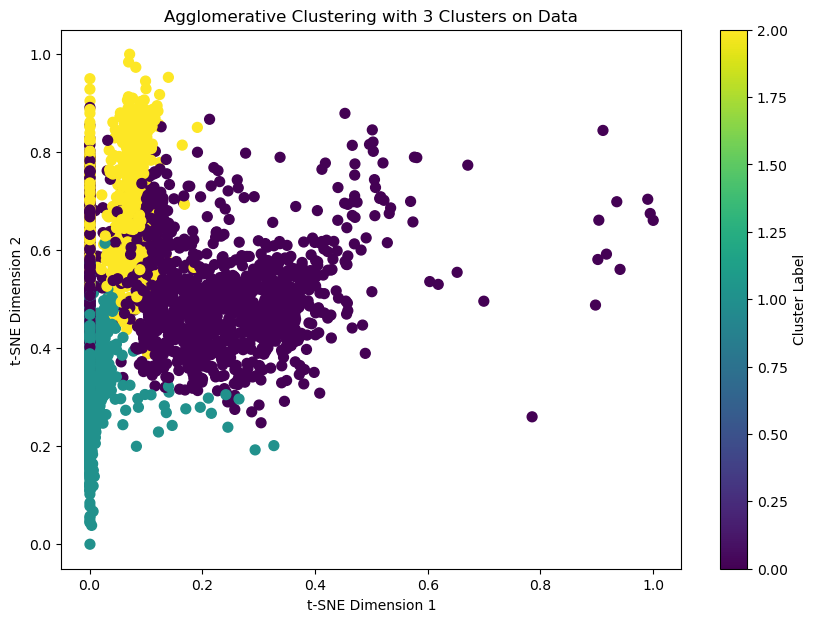

In [14]:
import numpy as np
import pandas as pd
from sklearn.manifold import TSNE
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs

# Step 4: Apply Agglomerative Clustering with an optimal number of clusters
n_clusters = 3  # Set based on dendrogram inspection
agglo = AgglomerativeClustering(n_clusters=n_clusters)
labels = agglo.fit_predict(data)

# Step 5: Visualize the clustered data
plt.figure(figsize=(10, 7))
plt.scatter(data[:, 0], data[:, 1], c=labels, cmap='viridis', s=50)
plt.colorbar(label='Cluster Label')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title(f'Agglomerative Clustering with {n_clusters} Clusters on Data')
plt.show()


### HDBSCAN

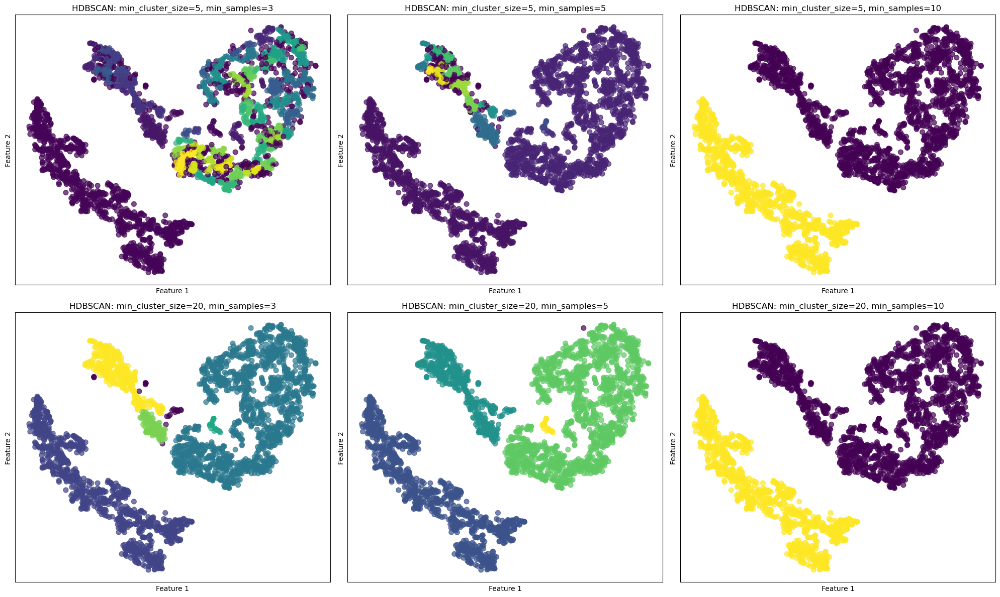

In [200]:
# Define different parameters
# UMAP PARAMS
hdbscan_params = [
    {'min_cluster_size': 5, 'min_samples': 2},
    {'min_cluster_size': 20, 'min_samples': 2},
    {'min_cluster_size': 100, 'min_samples': 2},
    {'min_cluster_size': 5, 'min_samples': 3},
    {'min_cluster_size': 20, 'min_samples': 3},
    {'min_cluster_size': 100, 'min_samples': 3},
]
# TSNE PARAMS
hdbscan_params = [
    {'min_cluster_size': 5, 'min_samples': 3},
    {'min_cluster_size': 5, 'min_samples': 5},
    {'min_cluster_size': 5, 'min_samples': 10},
    {'min_cluster_size': 20, 'min_samples': 3},
    {'min_cluster_size': 20, 'min_samples': 5},
    {'min_cluster_size': 20, 'min_samples': 10},
]

# Create a figure with three subplots
fig, axes = plt.subplots(2, 3, figsize=(20, 12), sharey=True)
axes = axes.flatten()

# Loop through each set of parameters and corresponding axis
for ax, params in zip(axes, hdbscan_params):
    # Initialize and fit HDBSCAN with the current parameters
    hdb = HDBSCAN(**params)
    labels = hdb.fit_predict(data)
    
    # Plot the clusters
    scatter = ax.scatter(
        data[:, 0], data[:, 1], c=labels, cmap='viridis', s=50, alpha=0.7
    )
    
    # Set title and labels
    ax.set_title(
        f"HDBSCAN: min_cluster_size={params['min_cluster_size']}, "
        f"min_samples={params['min_samples']}",
        fontsize=12
    )
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()


### OPTICS

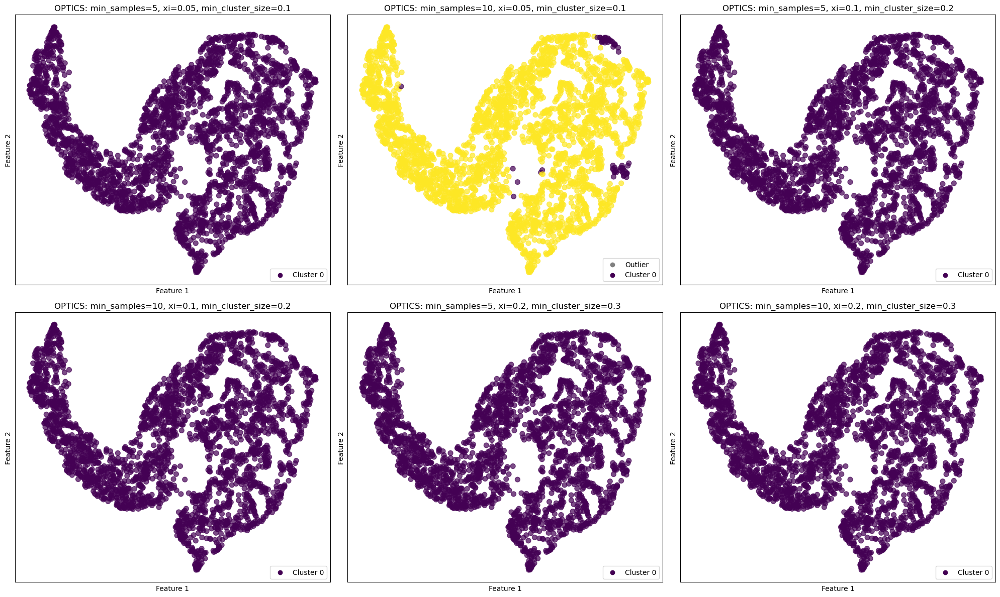

In [195]:
# Define different parameters for OPTICS
optics_params = [
    {'min_samples': 5, 'xi': 0.05, 'min_cluster_size': 0.1},
    {'min_samples': 10, 'xi': 0.05, 'min_cluster_size': 0.1},
    {'min_samples': 5, 'xi': 0.1, 'min_cluster_size': 0.2},
    {'min_samples': 10, 'xi': 0.1, 'min_cluster_size': 0.2},
    {'min_samples': 5, 'xi': 0.2, 'min_cluster_size': 0.3},
    {'min_samples': 10, 'xi': 0.2, 'min_cluster_size': 0.3}
]

# Create a figure with six subplots arranged in a 2x3 grid
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

# Loop through each set of parameters and corresponding axis
for ax, params in zip(axes, optics_params):
    # Initialize and fit OPTICS with the current parameters
    optics = OPTICS(**params)
    labels = optics.fit_predict(data)
    
    # Plot the clusters
    scatter = ax.scatter(
        data[:, 0], data[:, 1], c=labels, cmap='viridis', s=50, alpha=0.7
    )
    
    # Set title
    ax.set_title(
        f"OPTICS: min_samples={params['min_samples']}, "
        f"xi={params['xi']}, min_cluster_size={params['min_cluster_size']}",
        fontsize=12
    )
    
    # Add legends to each subplot if there are fewer than 10 unique labels
    unique_labels = np.unique(labels)
    if len(unique_labels) < 10:
        # Create a list to store the handles for the legend
        labels_list = []
        for label in unique_labels:
            if label == -1:
                # Outliers in grey
                labels_list.append(ax.scatter([], [], color='grey', label='Outlier'))
            else:
                # Use the colormap for cluster labels
                color = scatter.cmap(label / (max(unique_labels) if max(unique_labels) > 0 else 1))
                labels_list.append(ax.scatter([], [], color=color, label=f'Cluster {label}'))
        
        # Add legend with labels
        ax.legend(handles=labels_list, loc='lower right')
    
    # Set axis labels and remove ticks
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()
